In [1]:
# Import packages, initial settings

import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
import anndata
import scrublet as scr
import seaborn as sns
import magic
import pybiomart
import six
import sys
sys.modules['sklearn.externals.six'] = six
import scanorama
import harmonypy
import bbknn
import gseapy
from gseapy.plot import barplot, dotplot
import scvelo as scv
import scvi

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred']) 

sc.settings.set_figure_params(dpi=80, color_map='viridis', vector_friendly=False,  dpi_save=300, facecolor='white')
sc.logging.print_version_and_date()
#sc.logging.print_versions()


Global seed set to 0


Running Scanpy 1.8.1, on 2022-12-21 19:40.


In [9]:
adata=sc.read('./Objects/Annotated/Mesenchymal.h5ad')
print(adata.shape)

#sc.pp.normalize_total(adata, target_sum=1e4)
#sc.pp.log1p(adata)

(129898, 2479)


In [267]:
set(adata.obs.new_fine_grain)

{'B',
 'B1',
 'B_cycling',
 'Bpro',
 'CD4+T',
 'CD4+Treg',
 'CD8+T',
 'DC1',
 'DC2',
 'DC_mature',
 'Doublet',
 'ILC',
 'MP_CX3CR1+',
 'MP_LYVE1+',
 'MP_LYVE1+Collagen+',
 'MP_LYVE1+JUN+',
 'MP_LYVE1+_cycling',
 'MP_TIMD4+',
 'MP_TREM2+',
 'Mast cell',
 'Mono',
 'Mono_MPO+',
 'NK',
 'Plasmacytoid DC',
 'T-NK_cycling'}

In [268]:
#ClustersToStay=['T-NK_cycling','NK','CD8+T','CD4+Treg','CD4+T']
#adata=adata[[x for x in adata.obs_names if adata.obs.new_fine_grain[x] in ClustersToStay],:].copy()
#sc.pl.umap(adata, color='new_fine_grain')


adata=adata[adata.obs.new_fine_grain=='T-NK_cycling',:].copy()
#adata

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


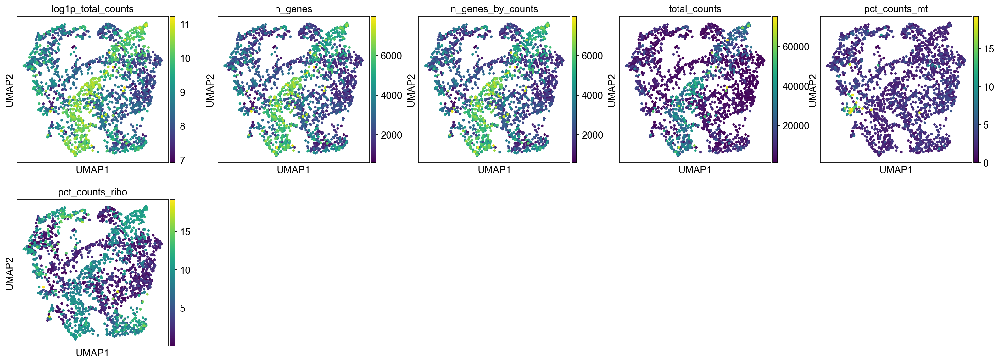

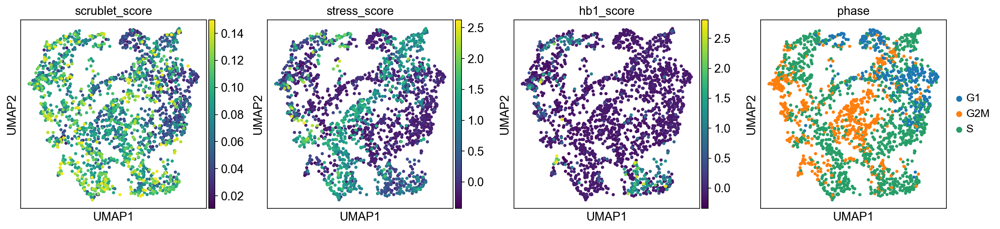

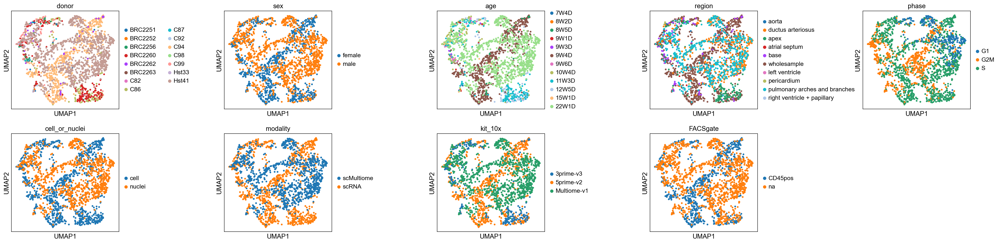

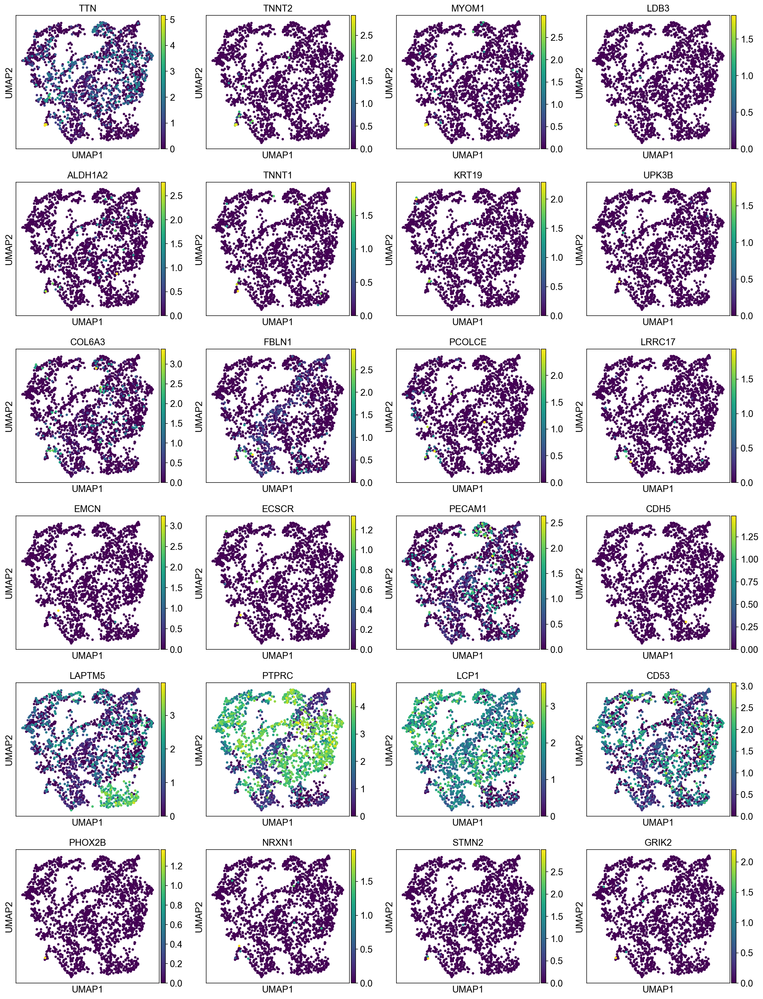

In [269]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata,min_dist=0.3)
#sc.tl.tsne(adata)

sc.pl.umap(adata, color=['log1p_total_counts','n_genes','n_genes_by_counts','total_counts','pct_counts_mt','pct_counts_ribo'],ncols=5)
sc.pl.umap(adata, color=['scrublet_score','stress_score', 'hb1_score','phase'], ncols=5,)
sc.pl.umap(adata, color=['donor','sex','age','region','phase','cell_or_nuclei','modality','kit_10x','FACSgate'],wspace=0.8,ncols=5)

Genes=['TTN','TNNT2','MYOM1','LDB3','ALDH1A2','TNNT1','KRT19','UPK3B','COL6A3','FBLN1','PCOLCE','LRRC17','EMCN','ECSCR','PECAM1','CDH5', 'LAPTM5','PTPRC','LCP1','CD53','PHOX2B','NRXN1','STMN2','GRIK2']
sc.pl.umap(adata, color=Genes)

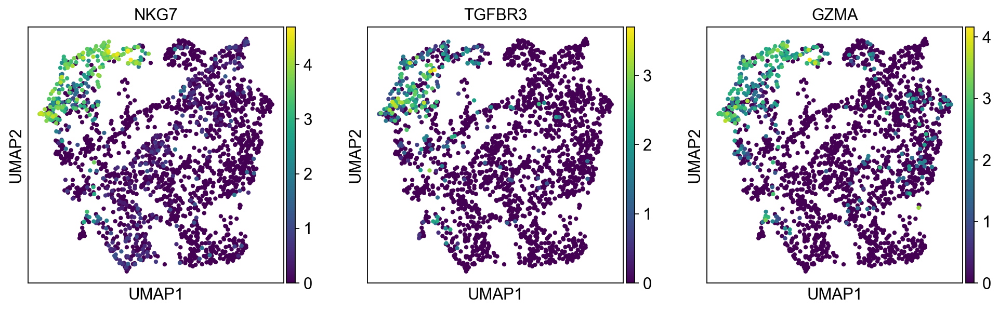

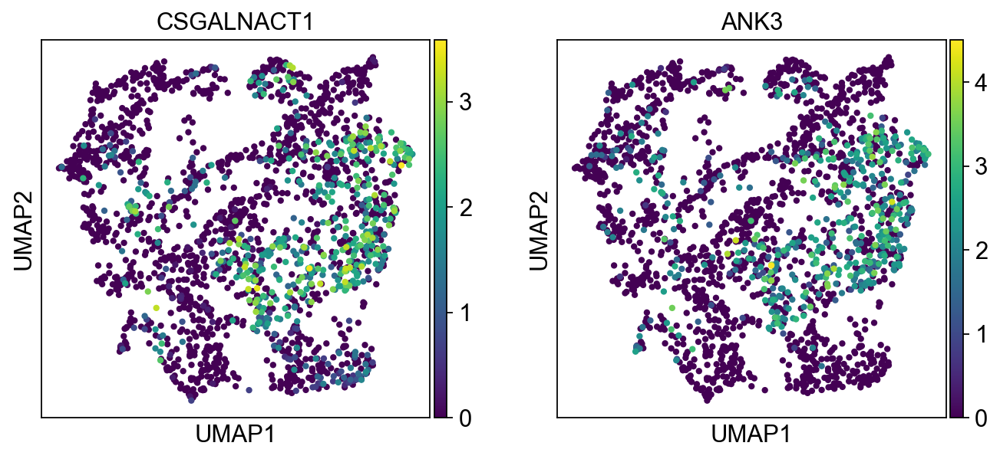

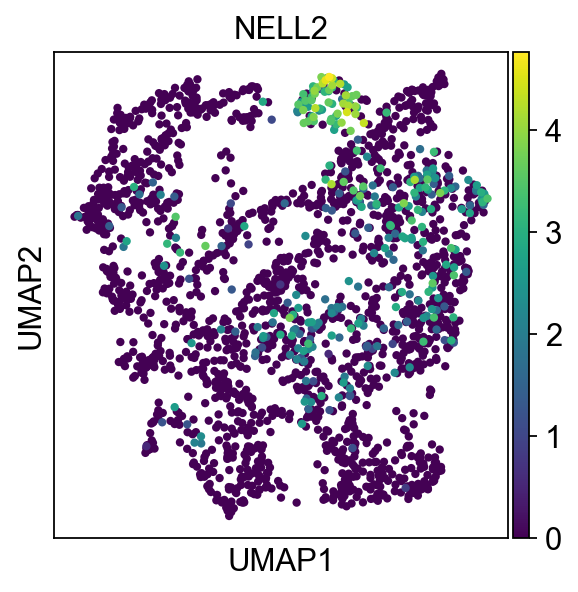

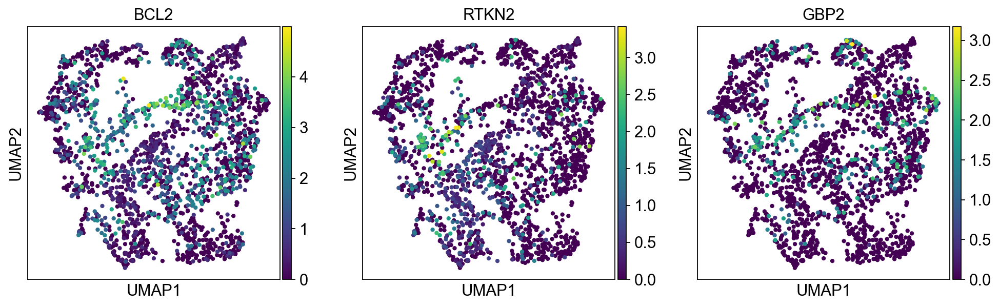

In [270]:
#sc.pl.umap(adata, color='new_fine_grain')
#sc.pl.umap(adata, color=['CD8Anew_fine_grain')
sc.pl.umap(adata, color=['NKG7','TGFBR3','GZMA'])
sc.pl.umap(adata, color=['CSGALNACT1','ANK3'])
sc.pl.umap(adata, color=['NELL2'])
sc.pl.umap(adata, color=['BCL2','RTKN2','GBP2'])

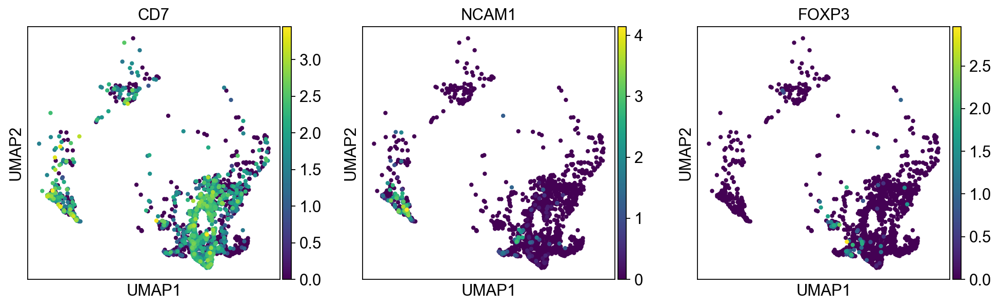

In [249]:
bdata=adata[adata.obs.new_fine_grain=='T-NK_cycling',:].copy()
sc.pl.umap(bdata, color=['CD7','NCAM1','FOXP3'])

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


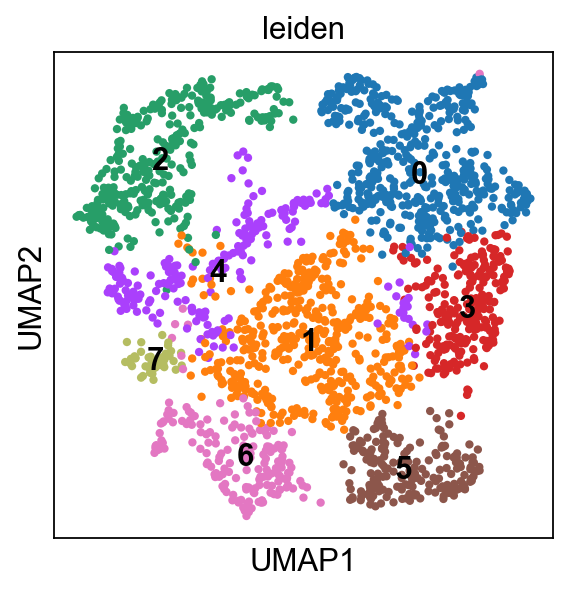

In [278]:
sc.tl.leiden(adata, resolution=0.4, key_added='leiden')
sc.pl.umap(adata, color='leiden',legend_loc='on data')

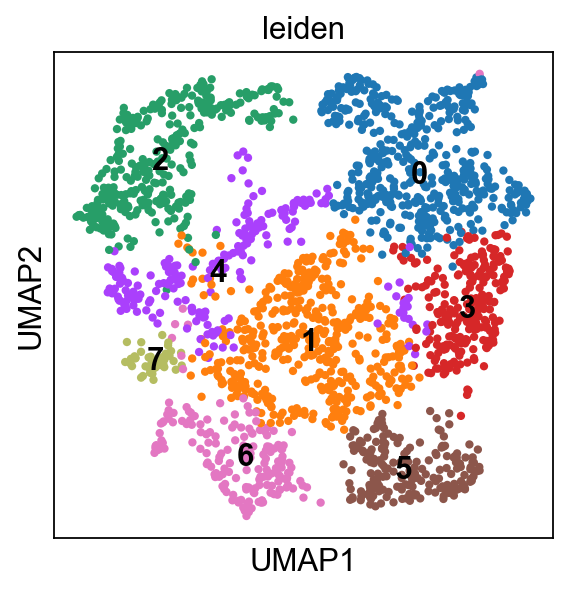

In [284]:
sc.pl.umap(adata, color='leiden',legend_loc='on data')

In [290]:

ClustersToStay=['5']

bdata=adata[[x for x in adata.obs_names if adata.obs.leiden[x] in ClustersToStay],:].copy()

bdatanames=bdata.obs_names

print(len(bdatanames))
np.savetxt('BAdd.txt', bdatanames, delimiter="\n", fmt="%s")

196


In [292]:
adata

AnnData object with n_obs × n_vars = 2138 × 36601
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'n_genes', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'HB_score', 'batch_key', '_scvi_batch', '_scvi_labels', 'previous_coarse_grain', 'previous_mid_grain', 'previous_fine_grain', 'leiden_scVI', 'FACSgate', 'S_score', 'G2M_score', 'phase', 'stress_score', 'hb1_score', 'hb2_score', 'leiden', 'coarse_grain', 'sex', 'age_binned', 'leiden_scVI_0.2', 'leiden_scVI_0.3', 'leiden_scVI_0.4', 'leiden_scVI_0.5', 'leiden_scVI_0.6', 'cell_type2'

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


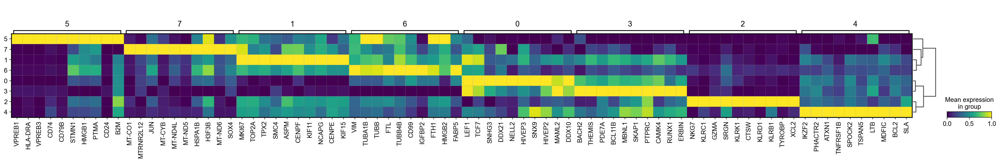

In [279]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='t-test')
sc.tl.dendrogram(adata, groupby='leiden')
#sc.pl.dendrogram(adata,groupby='leiden')
sc.pl.rank_genes_groups_matrixplot(adata, groupby='leiden', standard_scale='var')

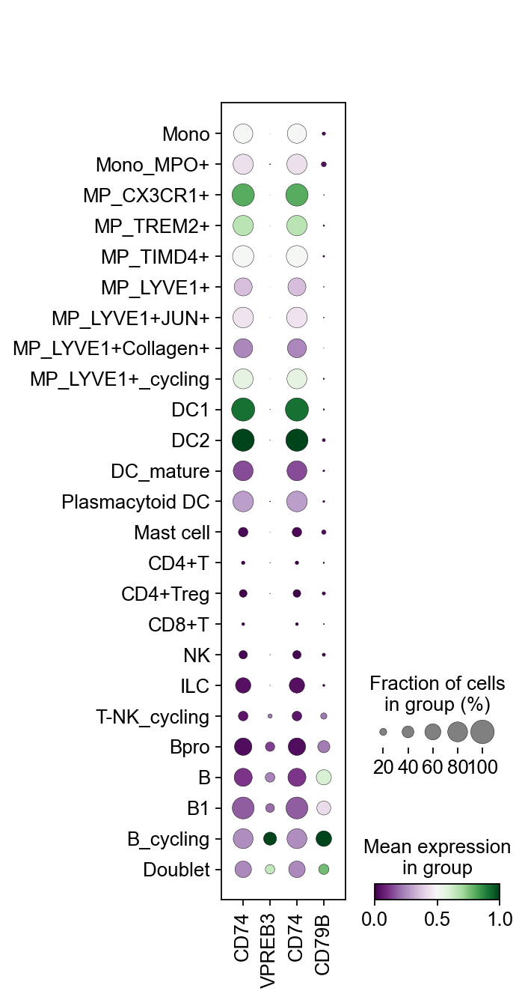

In [295]:
cdata=sc.read('./Objects/Annotated/Immune.h5ad')
sc.pl.dotplot(cdata, ['CD74','VPREB3','CD74','CD79B'] ,groupby='new_fine_grain',standard_scale='var',cmap='PRGn')


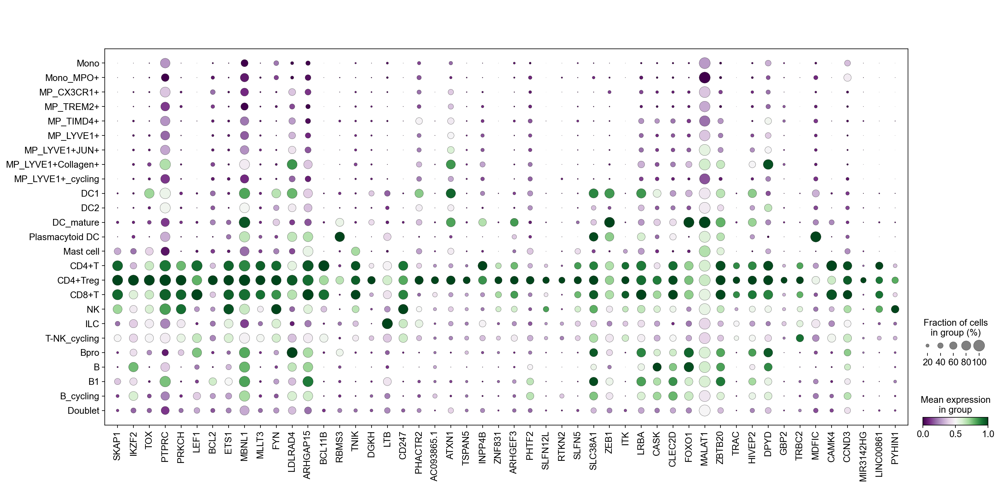

In [241]:
ClusterOfInterest='CD4+Treg'
#sc.tl.rank_genes_groups(adata, 'new_fine_grain', method='t-test', key_added = "t-test")
DEGenesForCluster = [x[ClusterOfInterest] for x in adata.uns['t-test']['names'][:50]]
sc.pl.dotplot(adata, DEGenesForCluster ,groupby='new_fine_grain',standard_scale='var',cmap='PRGn')
#sc.pl.umap(adata, color=DEGenesForCluster)

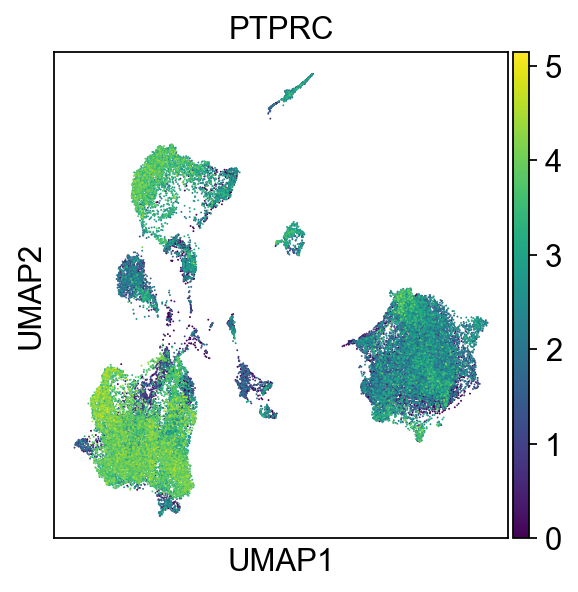

In [ ]:
Genes=['TTN','TNNT2','MYOM1','LDB3','ALDH1A2','TNNT1','KRT19','UPK3B','COL6A3','FBLN1','PCOLCE','LRRC17','EMCN','ECSCR','PECAM1','CDH5', 'LAPTM5','PTPRC','LCP1','CD53','PHOX2B','NRXN1','STMN2','GRIK2']
Genes=['PTPRC']
sc.pl.umap(adata, color=Genes)


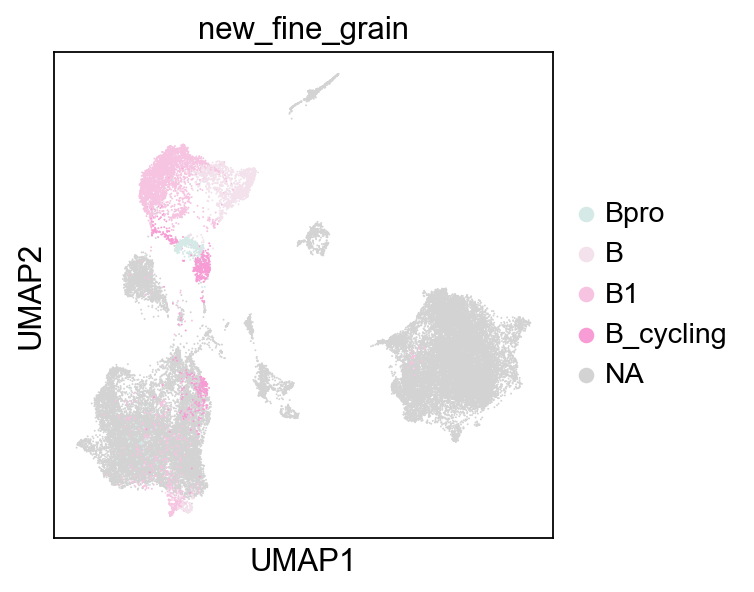

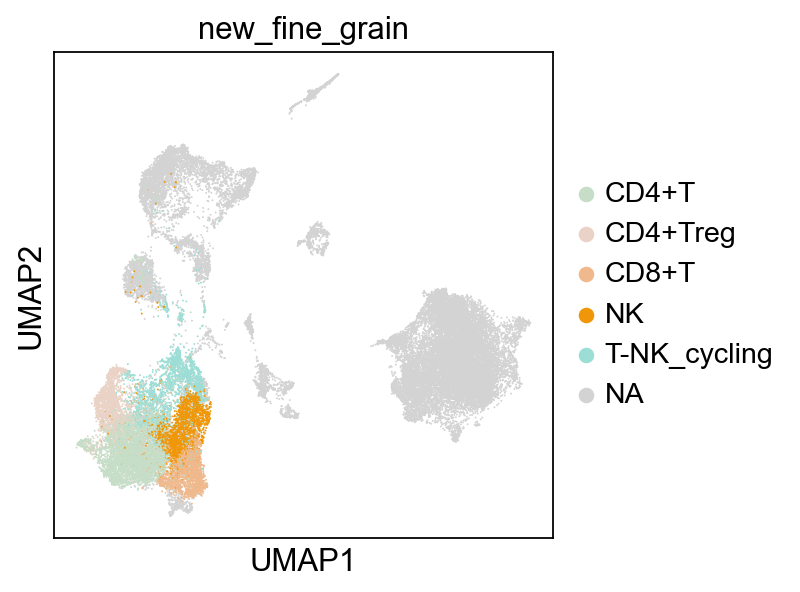

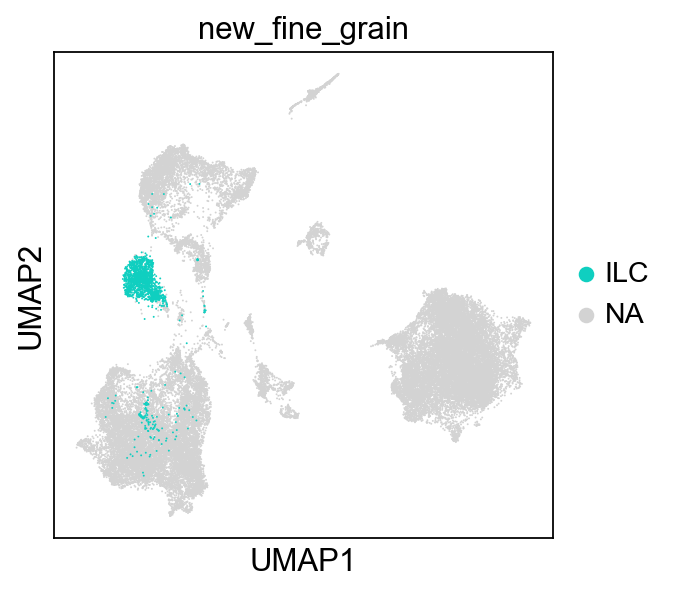

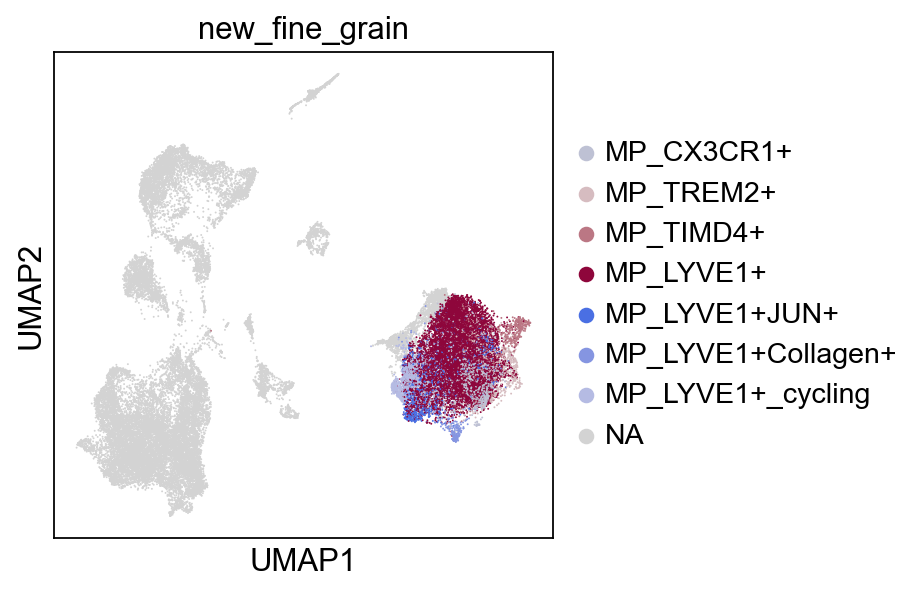

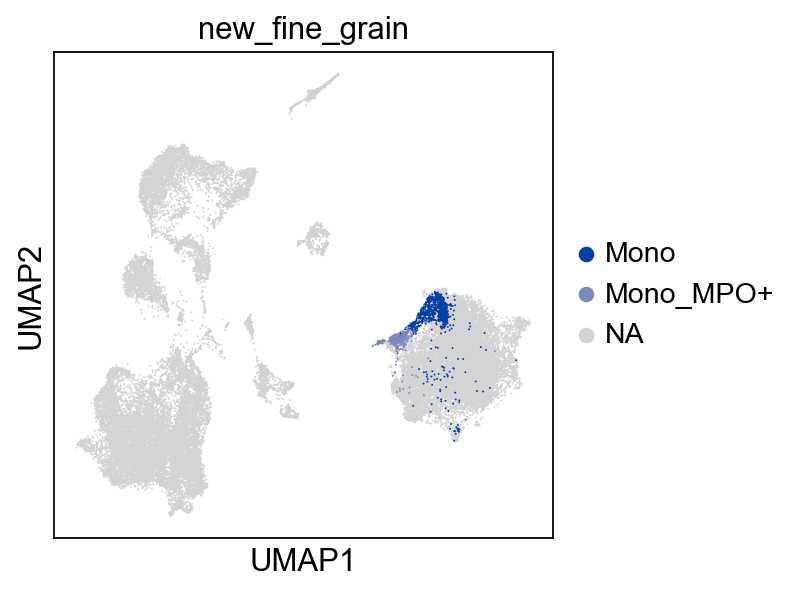

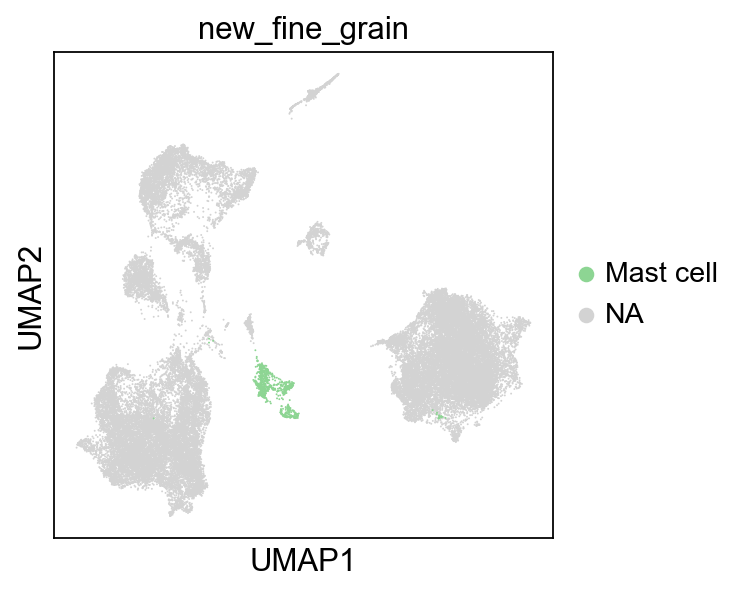

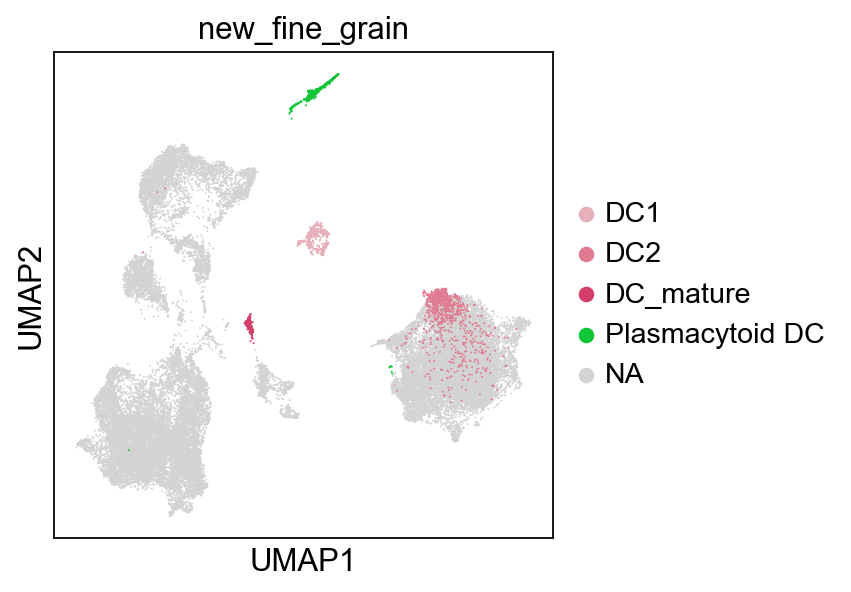

In [ ]:
sc.pl.umap(adata, color=['new_fine_grain'],groups=['B','B1','B_cycling','Bpro'])
sc.pl.umap(adata, color=['new_fine_grain'],groups=['CD4+T','
sc.pl.umap(adata, color=['new_fine_grain'],groups=['ILC'])
sc.pl.umap(adata, color=['new_fine_grain'],groups=['MP_CX3CR1+','MP_LYVE1+','MP_LYVE1+Collagen+','MP_LYVE1+JUN+','MP_LYVE1+_cycling','MP_TIMD4+','MP_TREM2+'])
sc.pl.umap(adata, color=['new_fine_grain'],groups=['Mono','Mono_MPO+'])
sc.pl.umap(adata, color=['new_fine_grain'],groups=['Mast cell'])
sc.pl.umap(adata, color=['new_fine_grain'],groups=['DC1','DC2','DC_mature','Plasmacytoid DC'])CD4+Treg','CD8+T','T-NK_cycling','NK'])

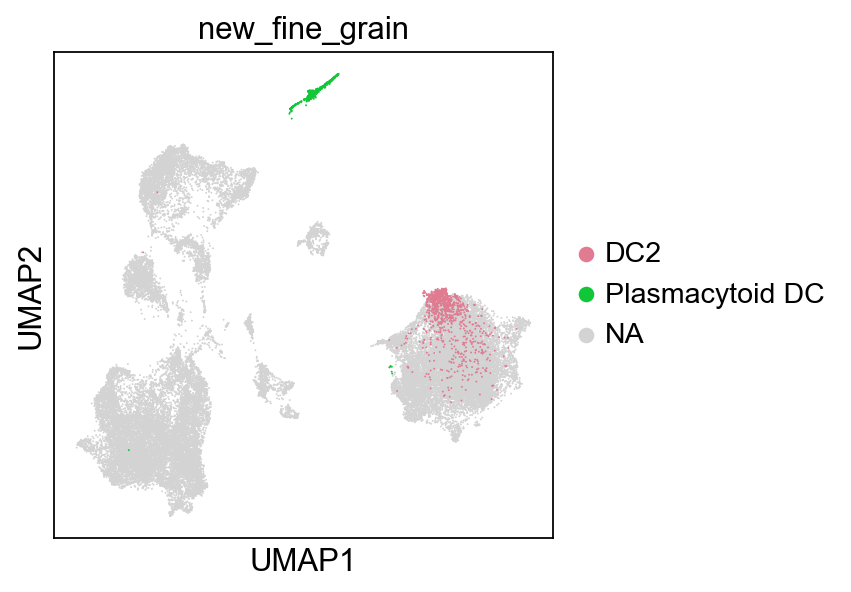

In [ ]:
sc.pl.umap(adata, color=['new_fine_grain'],groups=['DC2','Plasmacytoid DC'])

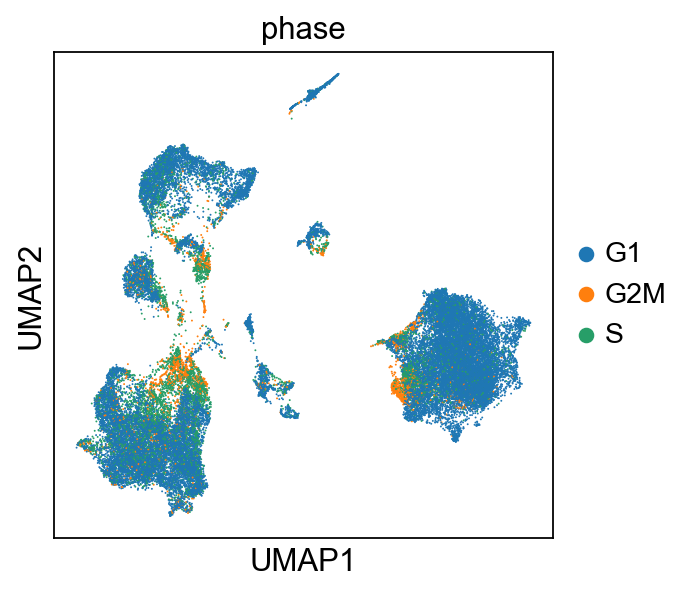

In [ ]:
sc.pl.umap(adata, color=['phase'])

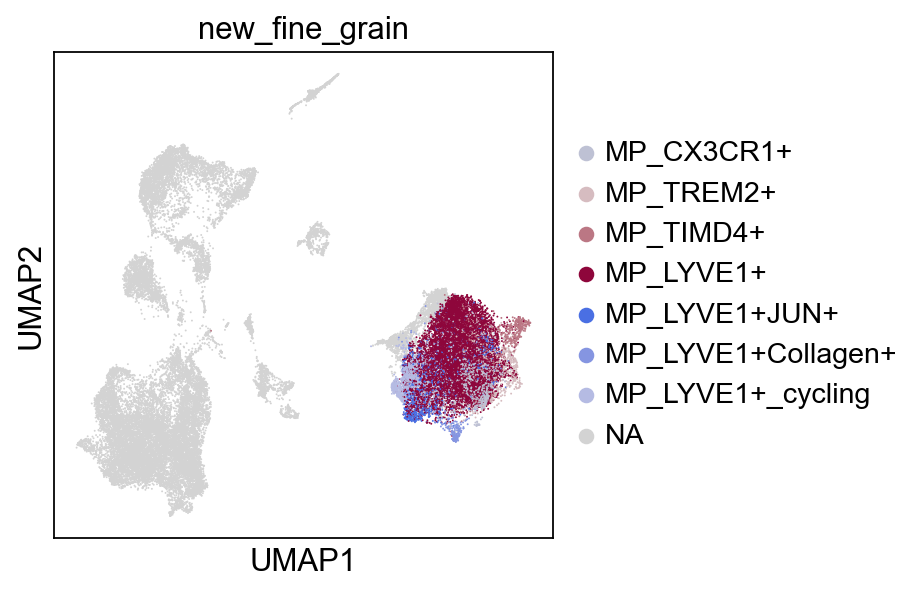

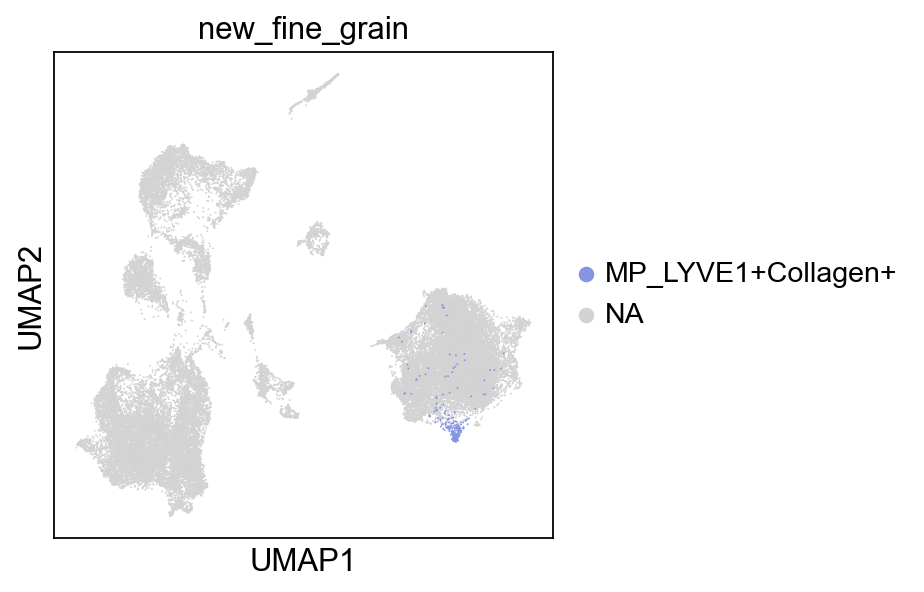

In [46]:
sc.pl.umap(adata, color=['new_fine_grain'],groups=['MP_CX3CR1+','MP_LYVE1+','MP_LYVE1+Collagen+','MP_LYVE1+JUN+','MP_LYVE1+_cycling','MP_TIMD4+','MP_TREM2+'])
sc.pl.umap(adata, color=['new_fine_grain'],groups=['MP_LYVE1+Collagen+'])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_new_fine_grain']`


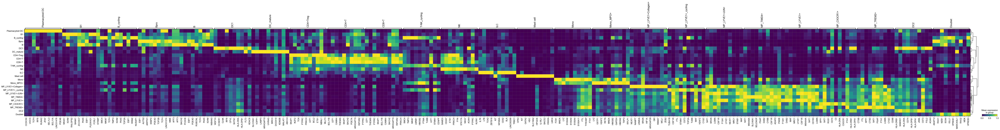

In [54]:
sc.tl.rank_genes_groups(adata, groupby='new_fine_grain', method='t-test')
sc.tl.dendrogram(adata, groupby='new_fine_grain')
#sc.pl.dendrogram(adata,groupby='leiden')
sc.pl.rank_genes_groups_matrixplot(adata, groupby='new_fine_grain', standard_scale='var')

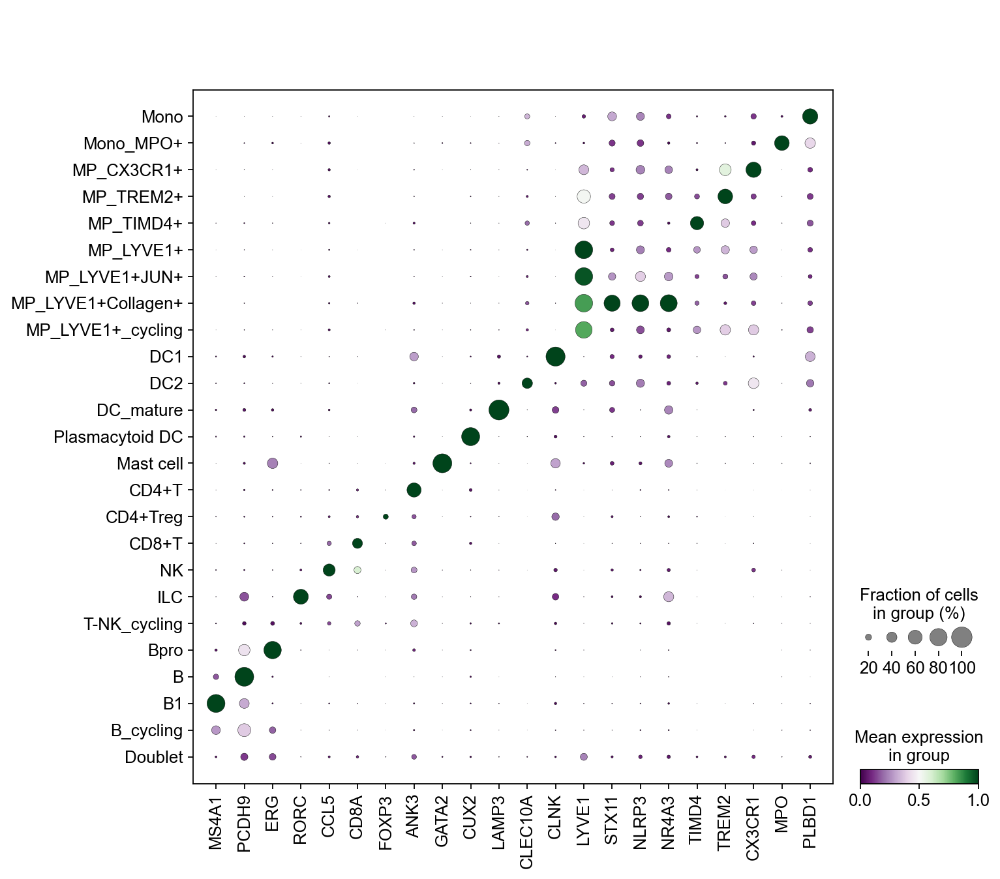

In [151]:
sc.pl.dotplot(adata, ['MS4A1','PCDH9','ERG','RORC','CCL5','CD8A','FOXP3','ANK3','GATA2','CUX2','LAMP3','CLEC10A','CLNK','LYVE1','STX11','NLRP3','NR4A3','TIMD4','TREM2','CX3CR1','MPO','PLBD1'] ,groupby='new_fine_grain',standard_scale='var',cmap='PRGn')